### Install Required Packages

We would be running `Stable Diffusion 2` so enable `GPU` under `View Resources > Change runtime type`

In [1]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-7f1c6051-703b-e600-dc5f-d6e759b1c359)


In [2]:
%%capture
!pip install diffusers
!pip install daam
!pip install git+https://github.com/RishiDarkDevil/daam-i2i.git
!pip install git+https://github.com/RishiDarkDevil/TITAN.git

### Import Necessary Libraries

We will load the necessary libraries required for generating DAAM outputs for input prompts.

In [1]:
# Plotting
from matplotlib import pyplot as plt

# Data Handling
import numpy as np

# Image Processing
import cv2
from PIL import Image

# Image Generation
from diffusers import StableDiffusionPipeline

# Heatmap generation
import daam
import daami2i

# Model
import torch

# annotations
import titan

### Load Model

In [2]:
DEVICE = 'cuda' # device

Now, let's load the `stabilityai/stable-diffusion-2-base` diffusion model.

In [3]:
model = StableDiffusionPipeline.from_pretrained('stabilityai/stable-diffusion-2-base')
model = model.to(DEVICE) # Set it to something else if needed, make sure DAAM supports that

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

### DAAM Image Attention

In [4]:
prompt = ['Chocolate cake, coffee, sandwich and sweets']

In [5]:
processed_prompt = titan.PromptHandler().clean_prompt(prompt)

Loading Models...

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


INFO:stanza:Downloading default packages for language: en (English) ...
INFO:stanza:File exists: /root/stanza_resources/en/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources.
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Loading these models for language: en (English):
| Processor | Package  |
------------------------
| tokenize  | combined |
| pos       | combined |
| lemma     | combined |

INFO:stanza:Using device: cuda
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: pos
INFO:stanza:Loading: lemma
INFO:stanza:Done loading processors!


Done
Tokenizing...Done
POS Tagging and Lemmatizing...Done
Processing...Done


In [6]:
processed_prompt

[('chocolate cake , coffee , sandwich and sweets',
  ['chocolate', 'cake', 'coffee', 'sandwich', 'sweets'],
  ['chocolate', 'cake', 'coffee', 'sandwich', 'sweet'])]

In [7]:
with daam.trace(model) as daam_trc:
  with daami2i.trace(model) as daami2i_trc:
    output_image = model(processed_prompt[0][0]).images
    image_global_heat_map = daami2i_trc.compute_global_heat_map()
    word_global_heat_map = daam_trc.compute_global_heat_map()

  0%|          | 0/51 [00:00<?, ?it/s]

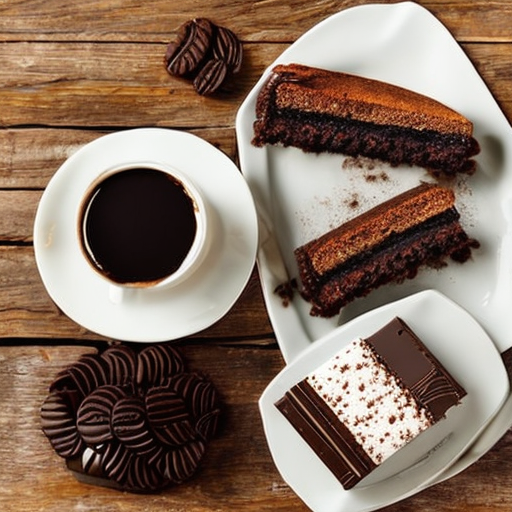

In [8]:
output_image[0]

### Visualize Heatmaps

In [9]:
annotations = list()
object_annotator = titan.ObjectAnnotator()

In [10]:
for i, word in enumerate(processed_prompt[0][1]):
  # Compute heatmap for a non-stopword
  word_heatmap = word_global_heat_map.compute_word_heat_map(word).expand_as(output_image[0]).numpy()

  # Annotate the Word Heatmap for current word
  anns = object_annotator.wordheatmap_to_annotations(
    word_heatmap, 100*i, 1, i
    )

  annotations.append(anns)

In [11]:
len(annotations)

5

In [12]:
len(annotations[0])

3

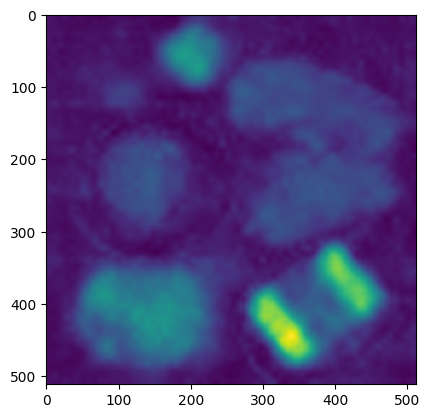

In [13]:
plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][0]).expand_as(output_image[0]).numpy())

In [44]:
heatmaps = list()
for k in range(len(annotations[0])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[0][k]['segmentation'][0][i], annotations[0][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[0][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

In [45]:
heatmap = np.mean(np.concatenate(heatmaps), 0)

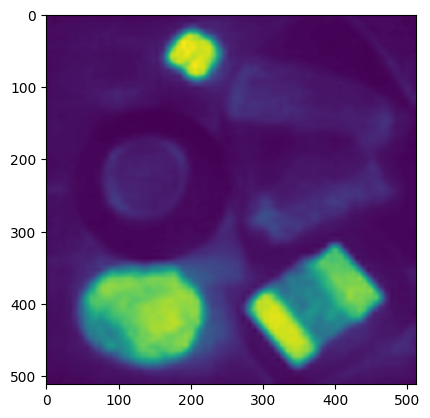

In [16]:
plt.imshow(heatmap)

In [ ]:
# Influx Mode
heatmaps = list()
for k in range(len(annotations[0])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[0][k]['segmentation'][0][i], annotations[0][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[0][k]['segmentation'][0]), 2)], 
      512, 512, influx=True).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

In [ ]:
heatmap = np.mean(np.concatenate(heatmaps), 0)

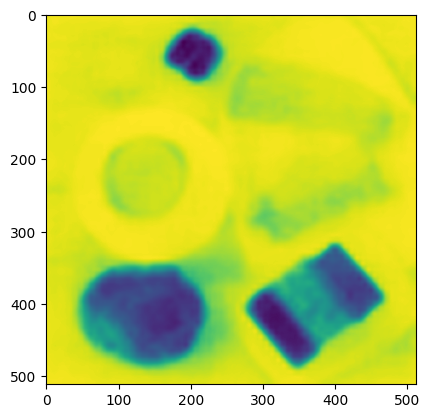

In [ ]:
plt.imshow(heatmap)

In [47]:
# word_heatmap
word_heat = word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][0])

# To store weighted average of all the heatmaps with weights as the text heatmap pixel weights
pixel_heatmap = torch.zeros((image_global_heat_map.latent_h, image_global_heat_map.latent_w))

for i in range(image_global_heat_map.latent_h):
  for j in range(image_global_heat_map.latent_w):
    pixel_heatmap += image_global_heat_map.compute_pixel_heat_map(image_global_heat_map.latent_w * i + j).heatmap.cpu() * word_heat.heatmap.cpu()[i][j].item() ## word_heat is large need to cover it

pixel_heatmap /= word_heat.heatmap.cpu().sum().item()

pixel_heatmap = daami2i.PixelHeatMap(pixel_heatmap).expand_as(output_image[0]).numpy()

# # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)    

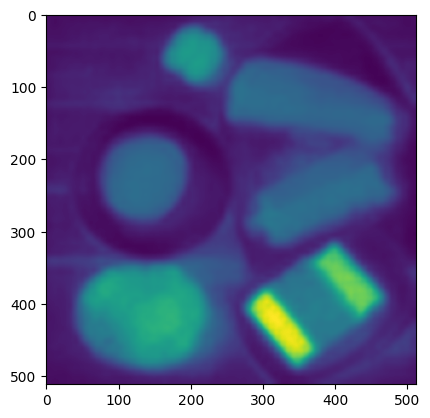

In [18]:
plt.imshow(heatmap)

In [57]:
# word_heatmap
word_heat = word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][0])

# To store weighted average of all the heatmaps with weights as the text heatmap pixel weights
pixel_heatmap = torch.zeros((image_global_heat_map.latent_h, image_global_heat_map.latent_w))

for i in range(image_global_heat_map.latent_h):
  for j in range(image_global_heat_map.latent_w):
    pixel_heatmap += image_global_heat_map.compute_pixel_heat_map([image_global_heat_map.latent_w * i + j], influx=True).heatmap.cpu() * word_heat.heatmap.cpu()[i][j].item() ## word_heat is large need to cover it

pixel_heatmap /= word_heat.heatmap.cpu().sum().item()

pixel_heatmap = daami2i.PixelHeatMap(pixel_heatmap).expand_as(output_image[0]).numpy()

# # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)    

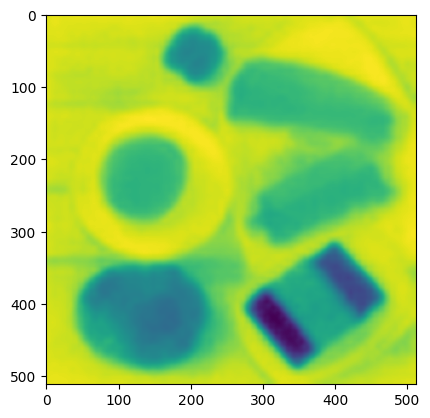

In [58]:
plt.imshow(heatmap)

In [19]:
len(annotations[1])

2

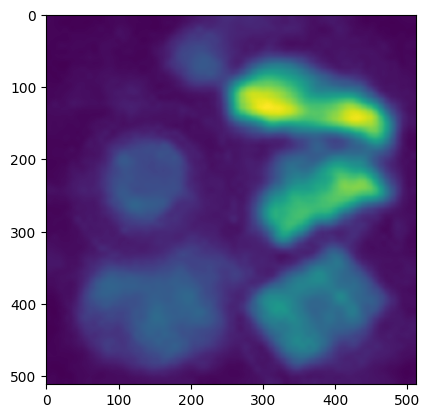

In [20]:
plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][1]).expand_as(output_image[0]).numpy())

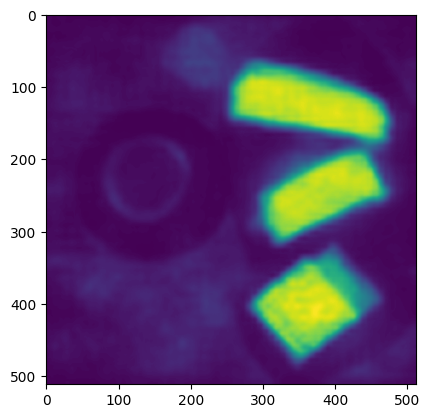

In [21]:
heatmaps = list()
for k in range(len(annotations[1])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[1][k]['segmentation'][0][i], annotations[1][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[1][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

# computing mean of heatmaps
heatmap = np.mean(np.concatenate(heatmaps), 0)

# Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(heatmap, dtype = np.uint8)

plt.imshow(heatmap)

In [22]:
# word_heatmap
word_heat = word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][1])

# To store weighted average of all the heatmaps with weights as the text heatmap pixel weights
pixel_heatmap = torch.zeros((image_global_heat_map.latent_h, image_global_heat_map.latent_w))

for i in range(image_global_heat_map.latent_h):
  for j in range(image_global_heat_map.latent_w):
    pixel_heatmap += image_global_heat_map.compute_pixel_heat_map(image_global_heat_map.latent_w * i + j).heatmap.cpu() * word_heat.heatmap.cpu()[i][j].item() ## word_heat is large need to cover it

pixel_heatmap /= word_heat.heatmap.cpu().sum().item()

pixel_heatmap = daami2i.PixelHeatMap(pixel_heatmap).expand_as(output_image[0]).numpy()

# # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)    

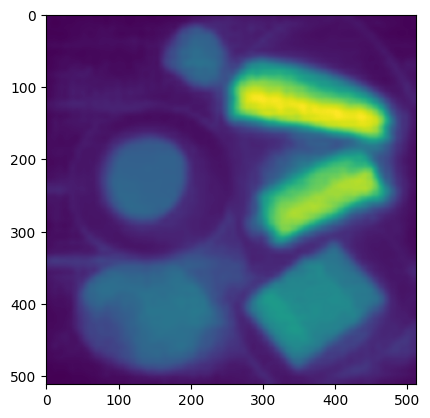

In [23]:
plt.imshow(heatmap)

In [24]:
len(annotations[2])

3

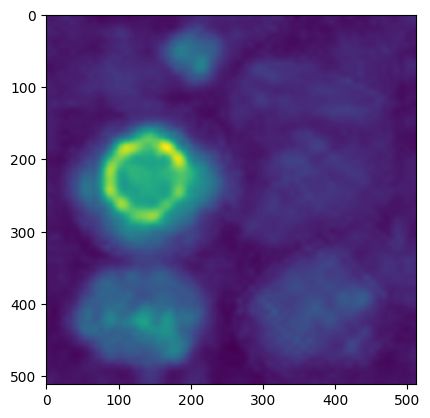

In [68]:
plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][2]).expand_as(output_image[0]).numpy())

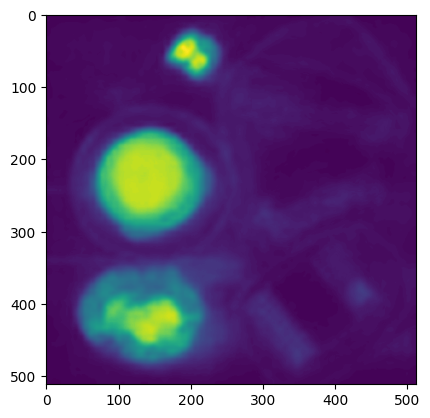

In [69]:
heatmaps = list()
for k in range(len(annotations[2])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[2][k]['segmentation'][0][i], annotations[2][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[2][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

# computing mean of heatmaps
heatmap = np.mean(np.concatenate(heatmaps), 0)

# Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(heatmap, dtype = np.uint8)

plt.imshow(heatmap)

In [100]:
# word_heatmap
word_heat = word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][2])

# To store weighted average of all the heatmaps with weights as the text heatmap pixel weights
pixel_heatmap = torch.zeros((image_global_heat_map.latent_h, image_global_heat_map.latent_w))

for i in range(image_global_heat_map.latent_h):
  for j in range(image_global_heat_map.latent_w):
    pixel_heatmap += image_global_heat_map.compute_pixel_heat_map(image_global_heat_map.latent_w * i + j).heatmap.cpu() * word_heat.heatmap.cpu()[i][j].item() ## word_heat is large need to cover it

pixel_heatmap /= word_heat.heatmap.cpu().sum().item()

pixel_heatmap_iter = pixel_heatmap # For iterative Refining Experiment

pixel_heatmap = daami2i.PixelHeatMap(pixel_heatmap).expand_as(output_image[0]).numpy()

# # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)    

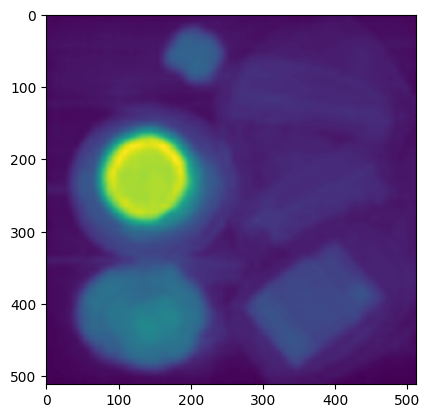

In [101]:
plt.imshow(heatmap)

In [29]:
len(annotations[3])

2

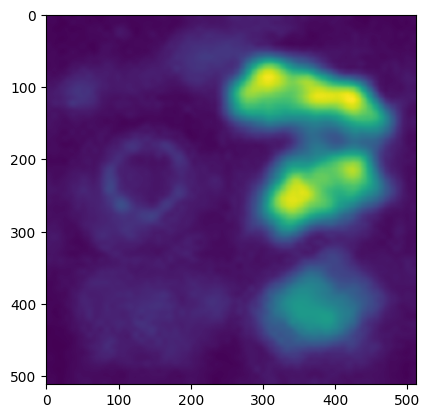

In [30]:
plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][3]).expand_as(output_image[0]).numpy())

In [31]:
heatmaps = list()
for k in range(len(annotations[3])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[3][k]['segmentation'][0][i], annotations[3][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[3][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

In [32]:
heatmap = np.mean(np.concatenate(heatmaps), 0)

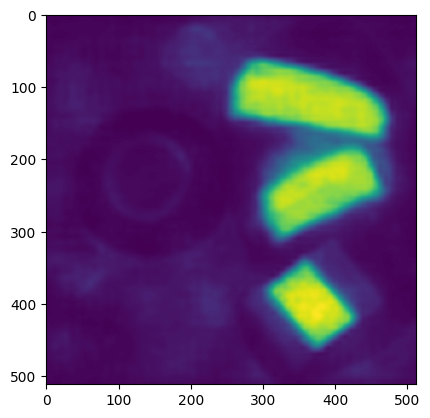

In [33]:
plt.imshow(heatmap)

In [34]:
# word_heatmap
word_heat = word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][3])

# To store weighted average of all the heatmaps with weights as the text heatmap pixel weights
pixel_heatmap = torch.zeros((image_global_heat_map.latent_h, image_global_heat_map.latent_w))

for i in range(image_global_heat_map.latent_h):
  for j in range(image_global_heat_map.latent_w):
    pixel_heatmap += image_global_heat_map.compute_pixel_heat_map(image_global_heat_map.latent_w * i + j).heatmap.cpu() * word_heat.heatmap.cpu()[i][j].item() ## word_heat is large need to cover it

pixel_heatmap /= word_heat.heatmap.cpu().sum().item()

pixel_heatmap = daami2i.PixelHeatMap(pixel_heatmap).expand_as(output_image[0]).numpy()

# # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)    

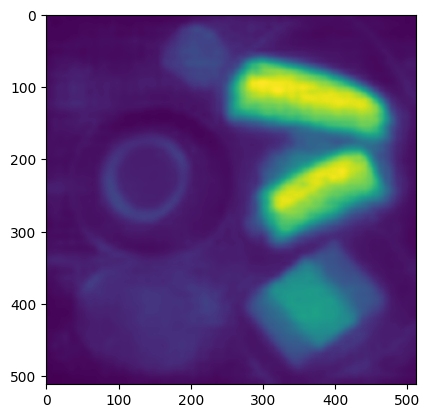

In [35]:
plt.imshow(heatmap)

In [36]:
len(annotations[4])

4

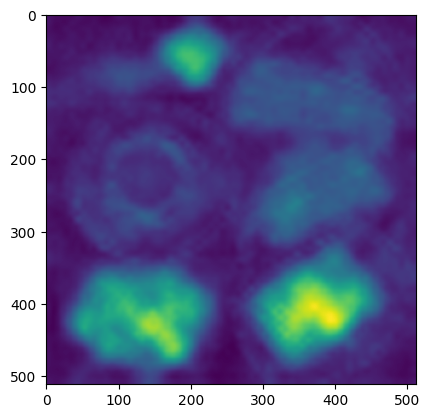

In [37]:
plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][4]).expand_as(output_image[0]).numpy())

In [38]:
heatmaps = list()
for k in range(len(annotations[4])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[4][k]['segmentation'][0][i], annotations[4][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[4][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

In [39]:
heatmap = np.mean(np.concatenate(heatmaps), 0)

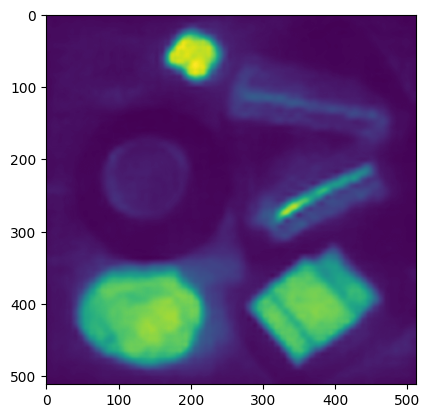

In [40]:
plt.imshow(heatmap)

In [41]:
# word_heatmap
word_heat = word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][4])

# To store weighted average of all the heatmaps with weights as the text heatmap pixel weights
pixel_heatmap = torch.zeros((image_global_heat_map.latent_h, image_global_heat_map.latent_w))

for i in range(image_global_heat_map.latent_h):
  for j in range(image_global_heat_map.latent_w):
    pixel_heatmap += image_global_heat_map.compute_pixel_heat_map(image_global_heat_map.latent_w * i + j).heatmap.cpu() * word_heat.heatmap.cpu()[i][j].item() ## word_heat is large need to cover it

pixel_heatmap /= word_heat.heatmap.cpu().sum().item()

pixel_heatmap = daami2i.PixelHeatMap(pixel_heatmap).expand_as(output_image[0]).numpy()

# # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)    

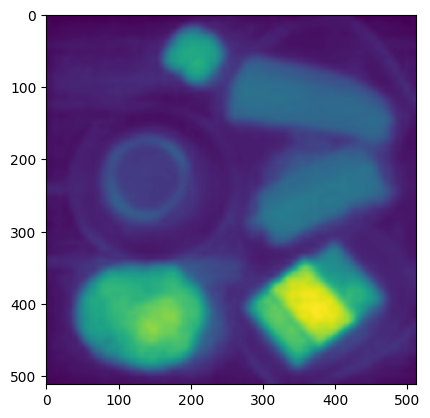

In [42]:
plt.imshow(heatmap)

### Object Detections

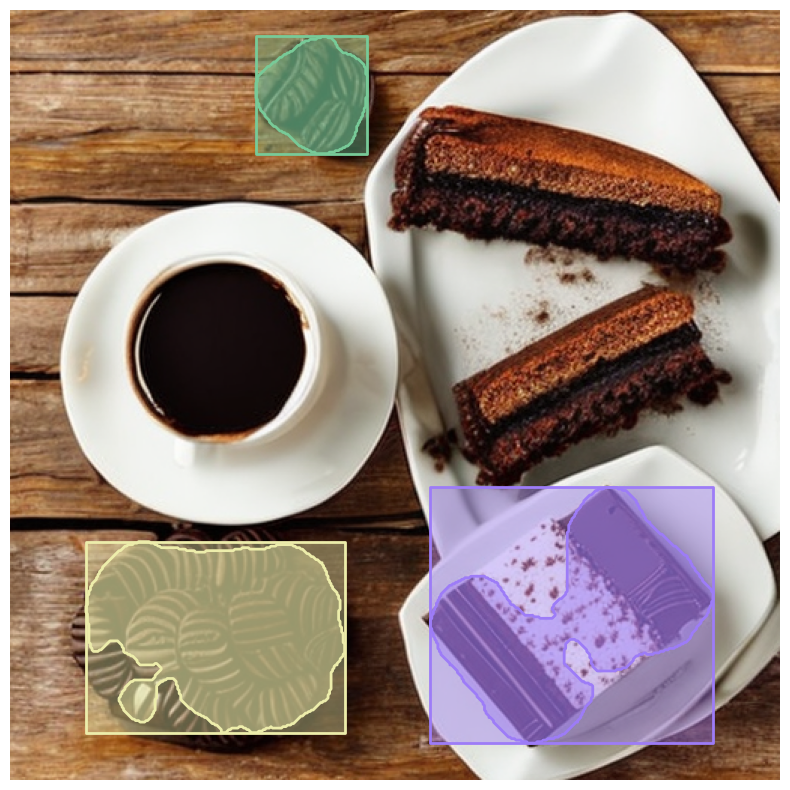

In [43]:
# Word Heatmap Version - Chcolate
object_annotator.show_annotations(np.asarray(output_image[0]), annotations[0])

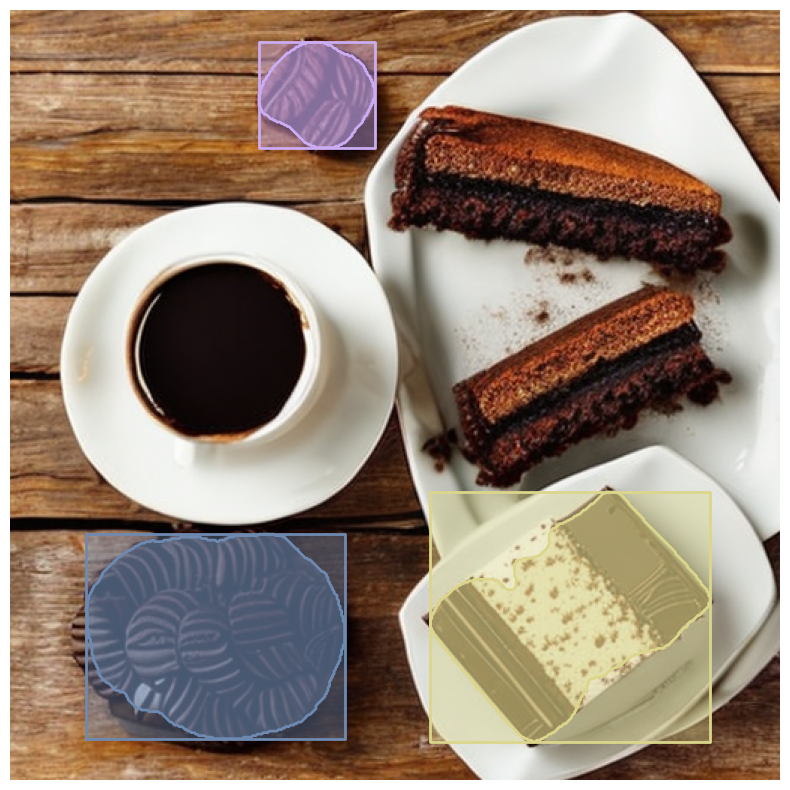

In [46]:
# Image Heatmap Version - Chocolate (Non Weighted)
object_annotator.show_annotations(np.asarray(output_image[0]), object_annotator.wordheatmap_to_annotations(heatmap/255))

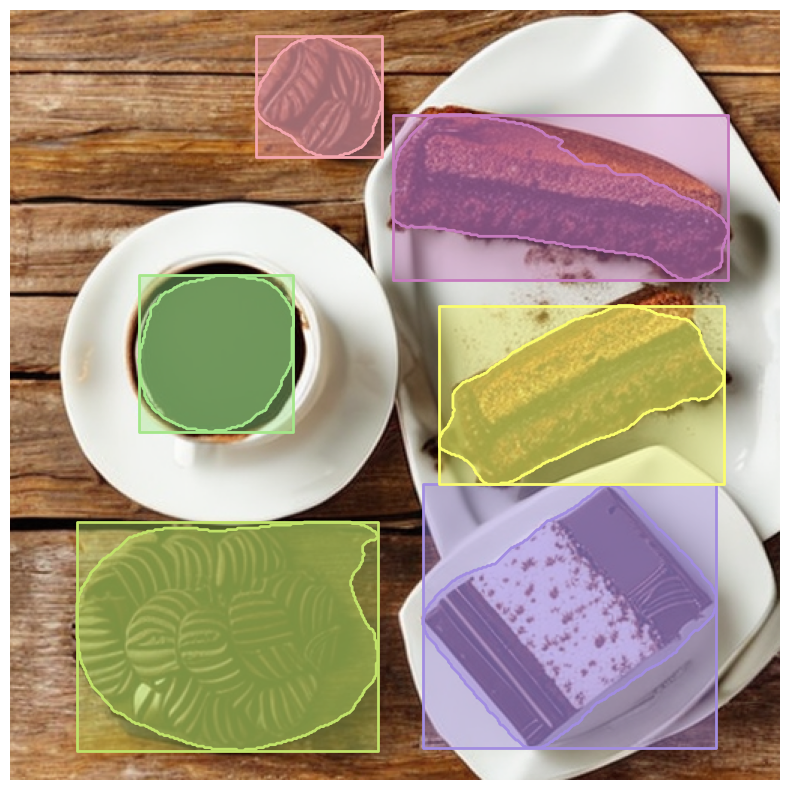

In [48]:
# Image Heatmap Version - Chocolate (Weighted)
object_annotator.show_annotations(np.asarray(output_image[0]), object_annotator.wordheatmap_to_annotations(heatmap/255))

### Iterative Refining

This does have improvement effect! At least slight

In [74]:
N_ITER = 5

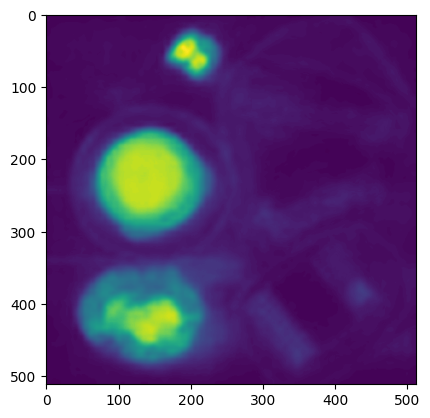

In [75]:
heatmap1 = heatmap # Coffee Non Weighted Heatmap
plt.imshow(heatmap1)

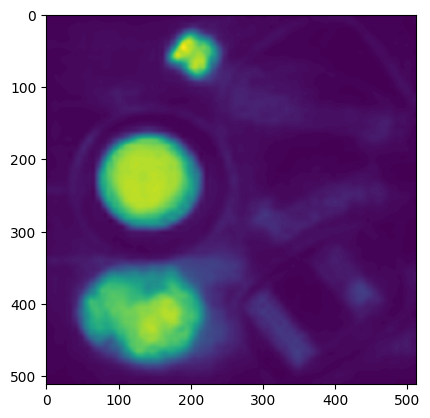

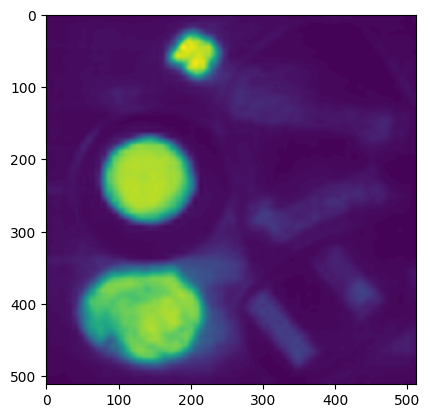

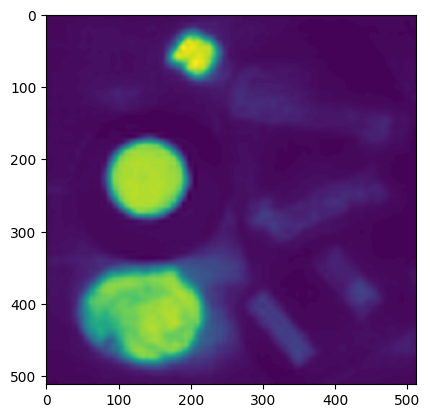

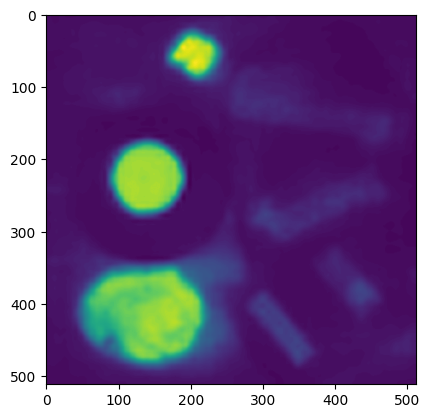

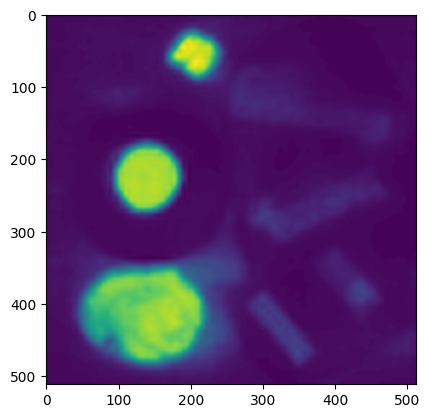

In [76]:
for _ in range(N_ITER):

  # image2image heatmap annotations
  annotations1 = object_annotator.wordheatmap_to_annotations(heatmap1/255)

  # image2image heatmap for the above newly refined contour
  heatmaps1 = list()
  for k in range(len(annotations1)):

    # Compute heatmap for inner pixels for contour boundary specified
    pixel_heatmap1 = image_global_heat_map.compute_contour_heat_map(
        [[annotations1[k]['segmentation'][0][i], annotations1[k]['segmentation'][0][i+1]] for i in range(0, len(annotations1[k]['segmentation'][0]), 2)], 
        512, 512).expand_as(output_image[0]).numpy()

    heatmaps1.append(pixel_heatmap1[np.newaxis, :, :])

  # Atleast one annotation must come after each refining if the original heatmap contained one
  if len(annotations1) <= 1:
    heatmap1 = np.array(heatmaps1[0][0], dtype=np.float64)
  else:
    heatmap1 = np.mean(np.concatenate(heatmaps1), 0)

  heatmap1 = np.array(np.array(heatmap1 * 255, dtype=np.uint8), dtype=np.float64)

  plt.imshow(heatmap1)

  plt.show()

In [107]:
N_ITER = 5

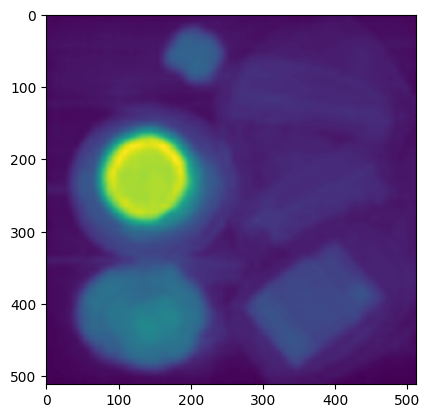

In [108]:
heatmap1 = pixel_heatmap_iter # Coffee Weighted Heatmap
plt.imshow(heatmap)

In [ ]:
# Image Heatmap is independent of the Text Heatmap Like Pixel Attention Level depends on image level features
# Though there is impact of Text Attentions on controlling how image attention is given..

# Bad Results
for _ in range(N_ITER):

  # To store weighted average of all the heatmaps with weights as the text heatmap pixel weights
  pixel_heatmap1 = torch.zeros((image_global_heat_map.latent_h, image_global_heat_map.latent_w))

  for i in range(image_global_heat_map.latent_h):
    for j in range(image_global_heat_map.latent_w):
      pixel_heatmap1 += image_global_heat_map.compute_pixel_heat_map(image_global_heat_map.latent_w * i + j).heatmap.cpu() * heatmap1[i][j].item() ## word_heat is large need to cover it

  pixel_heatmap1 /= heatmap1.sum().item()

  heatmap1 = pixel_heatmap1

  heatmap_after_iter = daami2i.PixelHeatMap(pixel_heatmap1).expand_as(output_image[0]).numpy()

  # # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap_after_iter = np.array(heatmap_after_iter * 255, dtype = np.uint8)    

  plt.imshow(heatmap_after_iter)

  plt.show()

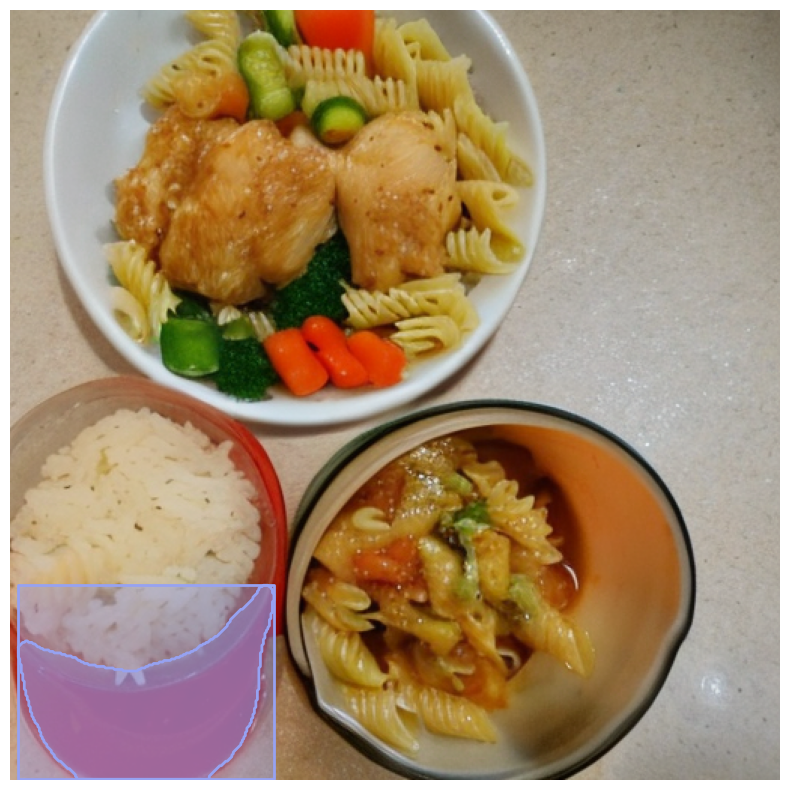

In [ ]:
# Image Heatmap Version - cotton (Before Refining)
object_annotator.show_annotations(np.asarray(output_image[0]), object_annotator.wordheatmap_to_annotations(heatmap/255))

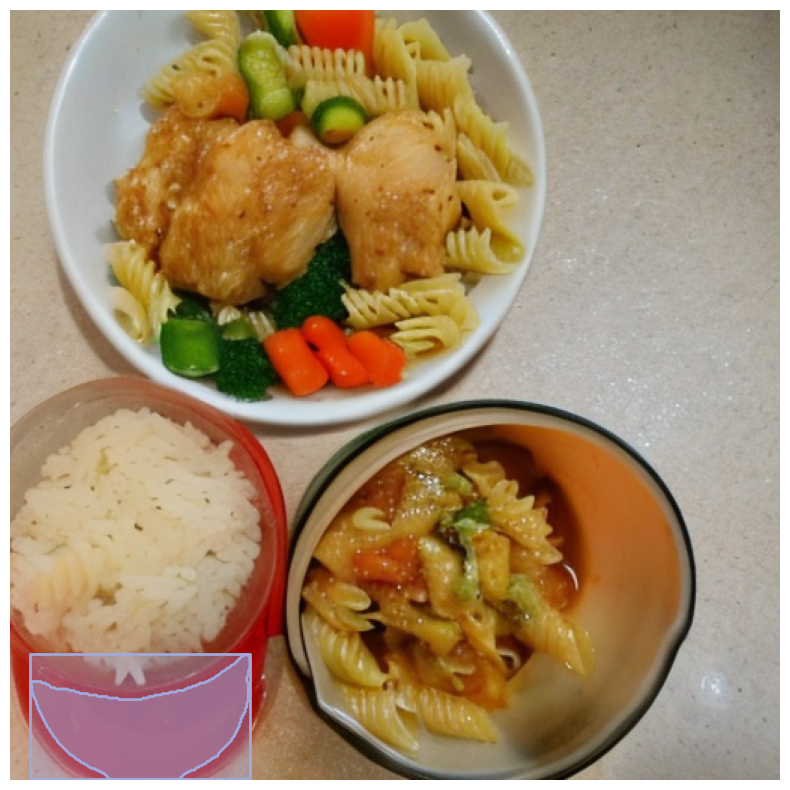

In [ ]:
# Image Heatmap Version - cotton (After Refining)
object_annotator.show_annotations(np.asarray(output_image[0]), object_annotator.wordheatmap_to_annotations(heatmap1/255))

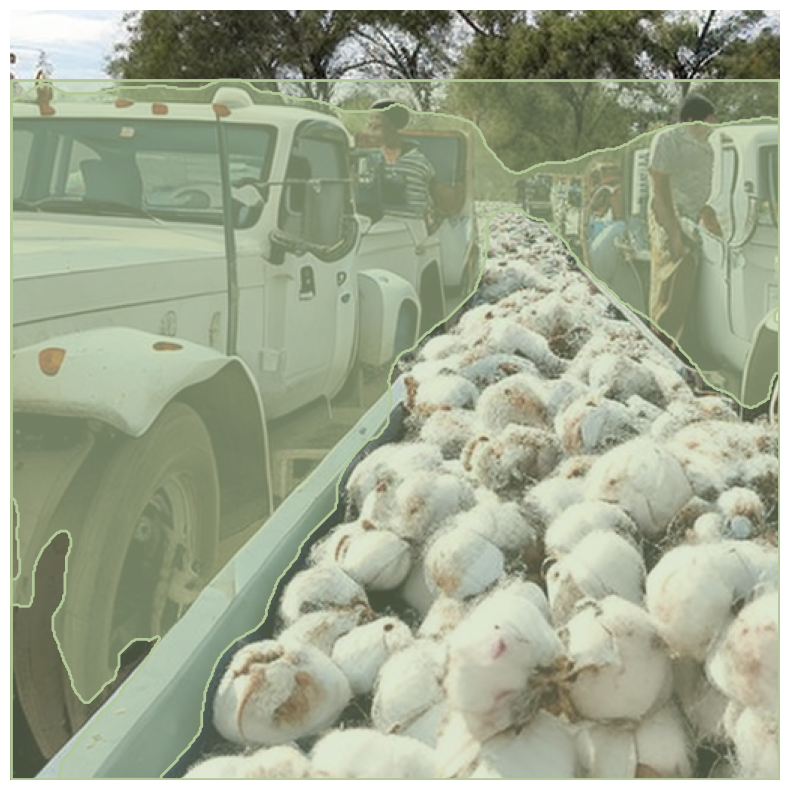

In [ ]:
# Image Heatmap Version - truck (Before Refining)
object_annotator.show_annotations(np.asarray(output_image[0]), object_annotator.wordheatmap_to_annotations(heatmap/255))

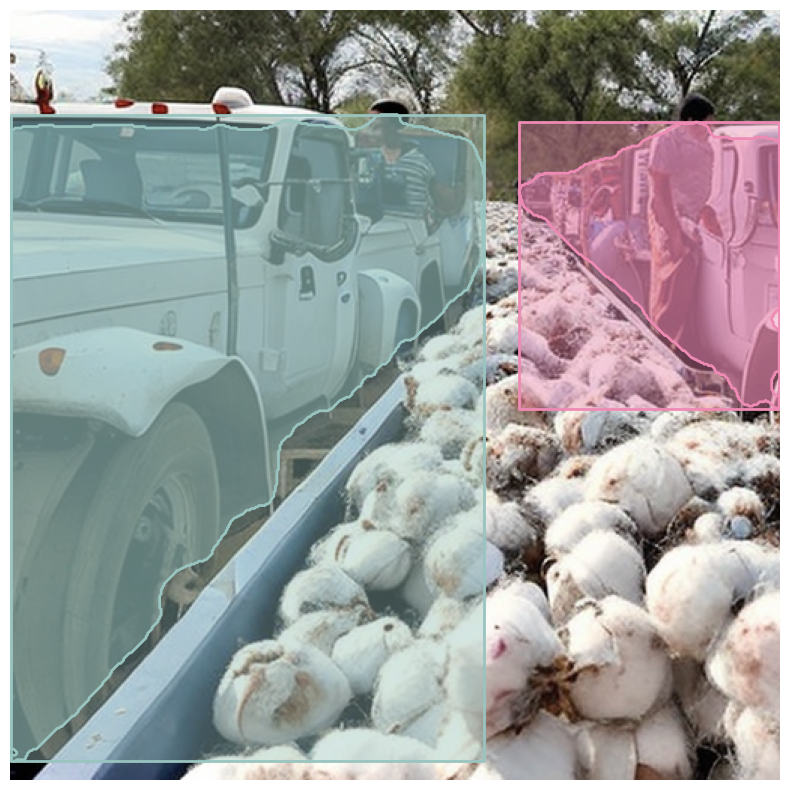

In [ ]:
# Image Heatmap Version - truck (After Refining)
object_annotator.show_annotations(np.asarray(output_image[0]), object_annotator.wordheatmap_to_annotations(heatmap1/255))